# Explore annealed-SMC beam fits

This notebook analyzes one compact SMC pickle written by `scripts/run_smc.py`.

1. reconstruct the canonical data and AEE forward model;
2. inspect the numerical SMC diagnostics;
3. fully explore the *amplitude-only posterior*;
4. fully explore the *amplitude + phase posterior*;
5. compare the nominal, amplitude-only, and complex beam models.

Posterior modes are identified **visually first** using random pairwise marginal projections. A Gaussian mixture model is used only afterward to assign particle labels when more than one mode is clearly present.

## 1. Imports and result file

In [1]:
from pathlib import Path
import pickle

import numpy as np
import healpy as hp
import jax
import jax.numpy as jnp

import corner
import cmasher as cmr
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

from sklearn.mixture import GaussianMixture

from mwa_jaxbeam import aee_137mhz as aee

colors = cmr.pride(np.linspace(0.1, 0.8, 256))
prd = ListedColormap(colors, name="pride")
prd.set_under("white")

wfr_div = cmr.wildfire.with_extremes(under="w")
wfr_lin = cmr.get_sub_cmap(cmr.wildfire, 0.5, 1.0).with_extremes(under="w")

MODE_COLORS = cmr.wildfire([0.2, 0.8])

In [2]:
RESULT_PATH = Path("../data/smc_nuts/S10YY_rf0YY.pkl")
OUTDIR_PATH = Path("../data/smc_nuts/plots")
OUTDIR_PATH.mkdir(parents=True, exist_ok=True)

with RESULT_PATH.open("rb") as handle:
    result = pickle.load(handle)

metadata = result["metadata"]
data = result["data"]
nominal_result = result["nominal"]
amplitude_result = result["amplitude"]
complex_result = result["complex"]
tilepol = f"{metadata["tile"]}{metadata["polarization"]}"

print("Dataset")
print("-------")
for key in (
    "tile", "polarization", "chunk_index", "chunk_days", "nside",
    "dirichlet_alpha", "phase_prior_std_deg", "prior_seed", "smc_seed",
    "final_mutation_seed",
):
    print(f"{key:24s}: {metadata[key]}")

print(f"{'amplitude particles':24s}: {amplitude_result['posterior_state']['particles'].shape[0]}")
print(f"{'complex particles':24s}: {complex_result['posterior_state']['particles'].shape[0]}")

Dataset
-------
tile                    : S10
polarization            : YY
chunk_index             : 0
chunk_days              : 200.0
nside                   : 32
dirichlet_alpha         : 10.0
phase_prior_std_deg     : 10.0
prior_seed              : 42
smc_seed                : 43
final_mutation_seed     : 44
amplitude particles     : 2496
complex particles       : 2496


## 2. Canonical data and likelihood pixels

The pickle stores the full HEALPix data/error maps and the exact comparison-pixel indices used during inference. These are the canonical arrays for every model comparison below.

In [3]:
data_map = np.asarray(data["data_map"], dtype=float)
error_map = np.asarray(data["error_map"], dtype=float)
comparison_indices = np.asarray(data["comparison_indices"], dtype=int)

observed_db = data_map[comparison_indices]
observed_sigma_db = error_map[comparison_indices]

NSIDE = int(metadata["nside"])
N_DIPOLES = 16
N_PIXELS = hp.nside2npix(NSIDE)
dipoles = np.arange(N_DIPOLES)

if data_map.shape != (N_PIXELS,):
    raise ValueError(f"Unexpected data-map shape: {data_map.shape}")
if not np.all(np.isfinite(observed_db)):
    raise ValueError("Likelihood data contain non-finite values.")
if not np.all(np.isfinite(observed_sigma_db) & (observed_sigma_db > 0)):
    raise ValueError("Likelihood uncertainties must be finite and positive.")

print("Canonical likelihood data")
print("-------------------------")
print(f"HEALPix pixels:       {N_PIXELS}")
print(f"Comparison pixels:    {comparison_indices.size}")
print(f"Finite data pixels:   {np.count_nonzero(np.isfinite(data_map))}")
print(f"Median uncertainty:   {np.median(observed_sigma_db):.4f} dB")

Canonical likelihood data
-------------------------
HEALPix pixels:       12288
Comparison pixels:    6061
Finite data pixels:   6186
Median uncertainty:   0.4075 dB


In [4]:
def plot_healpix_map(
    healpix_map,
    *,
    fig,
    sub,
    title="",
    unit="",
    vmin=None,
    vmax=None,
    cmap=None,
    badcolor="whitesmoke",
    add_graticule=True,
    add_cardinals=True,
    cardinal_color="white",
):
    healpix_map = np.asarray(healpix_map)
    axes_before = set(fig.axes)

    hp.orthview(
        map=healpix_map,
        fig=fig,
        sub=sub,
        rot=(0, 90, 180),
        half_sky=True,
        min=vmin,
        max=vmax,
        title=title,
        unit=unit,
        badcolor=badcolor,
        cmap=cmap,
        notext=True,
    )

    if add_graticule:
        hp.graticule(dpar=15, dmer=45, ls=":", lw=0.7, alpha=0.7)

    if add_cardinals:
        kwargs = {"color": cardinal_color, "fontweight": "light"}
        hp.projtext(np.deg2rad(80), np.deg2rad(90), r"$E$", verticalalignment="top", **kwargs)
        hp.projtext(np.deg2rad(80), np.deg2rad(0), r"$N$", horizontalalignment="right", **kwargs)
        hp.projtext(np.deg2rad(80), np.deg2rad(270), r"$W$", verticalalignment="bottom", **kwargs)
        hp.projtext(np.deg2rad(80), np.deg2rad(180), r"$S$", horizontalalignment="left", **kwargs)

    new_axes = [ax for ax in fig.axes if ax not in axes_before]
    return new_axes[0]


def comparison_values_to_healpix(values):
    values = np.asarray(values, dtype=float)
    if values.shape != comparison_indices.shape:
        raise ValueError(f"Expected {comparison_indices.shape}, received {values.shape}.")
    healpix_map = np.full(data_map.shape, np.nan, dtype=float)
    healpix_map[comparison_indices] = values
    return healpix_map

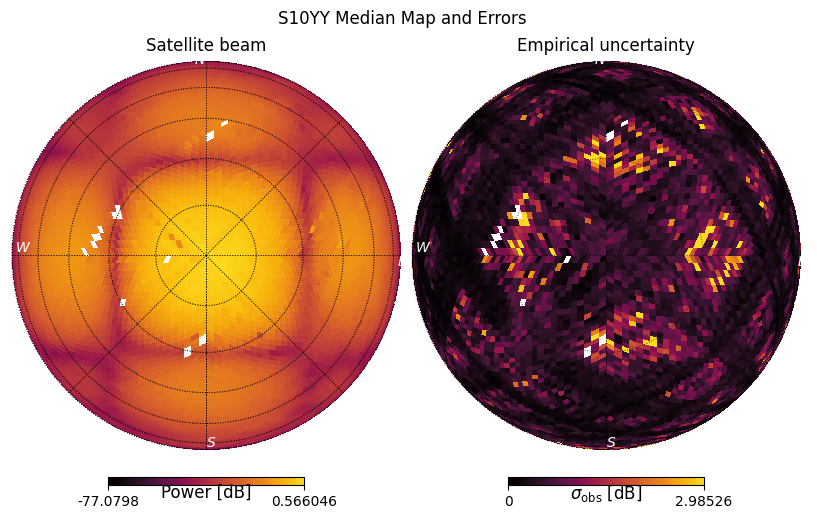

In [5]:
fig = plt.figure(figsize=(8, 5.3))
plot_healpix_map(
    data_map,
    fig=fig,
    sub=(1, 2, 1),
    title="Satellite beam",
    unit="Power [dB]",
    cmap=wfr_lin,
)
plot_healpix_map(
    error_map,
    fig=fig,
    sub=(1, 2, 2),
    title="Empirical uncertainty",
    unit=r"$\sigma_{\rm obs}$ [dB]",
    vmin=0,
    vmax=np.nanpercentile(error_map, 99),
    cmap=wfr_lin,
)
fig.suptitle(f"{tilepol} Median Map and Errors")
plt.savefig(f"{OUTDIR_PATH}/{tilepol}_1_map_errors.pdf")
plt.show()

## 3. Reconstruct the AEE forward model

Posterior beam populations are intentionally not stored in the pickle. The exact forward model used during inference is reconstructed here, and posterior beams are evaluated later in batches only when needed.

In [6]:
pixel_indices = np.arange(N_PIXELS)
za_hpx, az_hpx = hp.pix2ang(NSIDE, pixel_indices)
visible = za_hpx <= np.pi / 2
visible_indices = np.flatnonzero(visible)

visible_lookup = np.full(N_PIXELS, -1, dtype=np.int32)
visible_lookup[visible_indices] = np.arange(visible_indices.size, dtype=np.int32)
comparison_visible_indices = visible_lookup[comparison_indices]

if np.any(comparison_visible_indices < 0):
    raise ValueError("At least one comparison pixel lies outside the visible hemisphere.")

az_visible = jnp.asarray(az_hpx[visible], dtype=jnp.float32)
za_visible = jnp.asarray(za_hpx[visible], dtype=jnp.float32)
comparison_visible_indices_jax = jnp.asarray(comparison_visible_indices, dtype=jnp.int32)
POL = int(metadata["pol_index"])

@jax.jit
def predict_beam_db(excitation_pol):
    fixed = jnp.ones(N_DIPOLES, dtype=jnp.complex64)
    excitation_pol = excitation_pol.astype(jnp.complex64)
    excitations = (
        jnp.stack([excitation_pol, fixed])
        if POL == 0
        else jnp.stack([fixed, excitation_pol])
    )
    power = aee.power(
        az_rad=az_visible,
        za_rad=za_visible,
        excitations=excitations,
        normalize=True,
    )[POL, comparison_visible_indices_jax]
    power = jnp.maximum(power, jnp.finfo(power.dtype).tiny)
    return 10 * jnp.log10(power)

predict_beam_batch_db = jax.jit(jax.vmap(predict_beam_db, in_axes=0))

nominal_model_db = np.asarray(
    predict_beam_db(jnp.ones(N_DIPOLES, dtype=jnp.complex64)),
    dtype=float,
)
print("Nominal model shape:", nominal_model_db.shape)

Nominal model shape: (6061,)


## 4. SMC annealing diagnostics

These plots describe the numerical annealing path rather than the posterior. We check how $\beta$ advances, how the NUTS step size adapts, and whether acceptance/tree depth remain sensible.

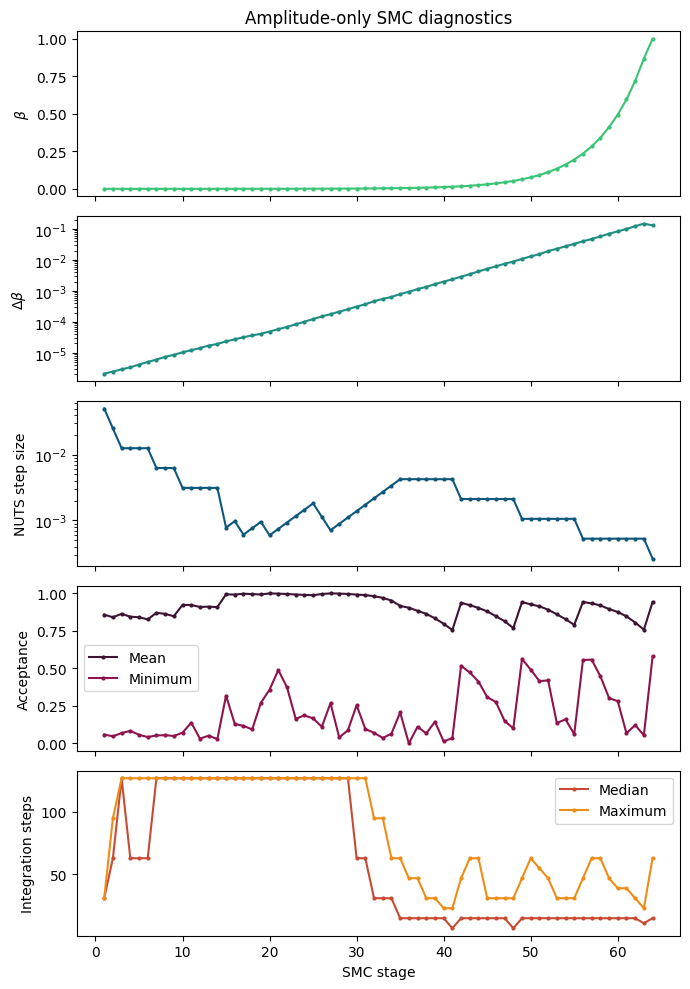

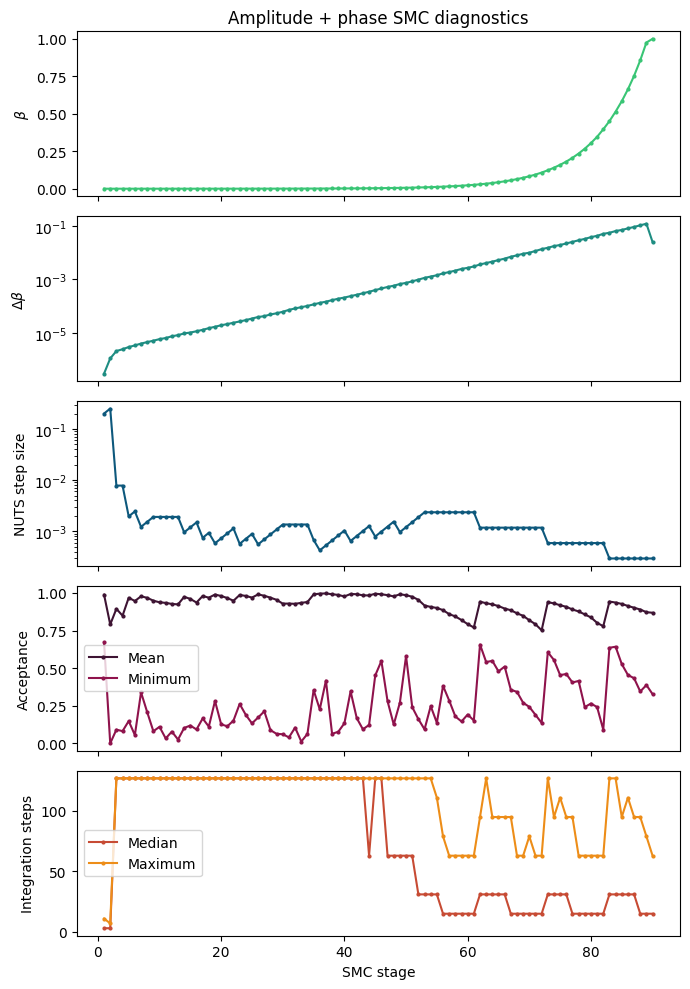

In [7]:
def plot_smc_diagnostics(fit, title):
    diagnostics = fit["stage_diagnostics"]
    history = {
        key: np.asarray([stage[key] for stage in diagnostics])
        for key in diagnostics[0]
    }
    stage = np.arange(1, len(diagnostics) + 1)
    colors = cmr.wildfire([0.1, 0.2, 0.3, 0.6, 0.7, 0.8, 0.9])

    fig, axes = plt.subplots(5, 1, figsize=(7, 10), sharex=True)
    axes[0].plot(stage, history["beta_next"], marker="o", ms=2, color=colors[0])
    axes[0].set_ylabel(r"$\beta$")
    axes[0].set_title(title)

    axes[1].plot(stage, history["delta_beta"], marker="o", ms=2, color=colors[1])
    axes[1].set_yscale("log")
    axes[1].set_ylabel(r"$\Delta\beta$")

    axes[2].plot(stage, history["nuts_step_size"], marker="o", ms=2, color=colors[2])
    axes[2].set_yscale("log")
    axes[2].set_ylabel("NUTS step size")

    axes[3].plot(stage, history["mean_acceptance_rate"], marker="o", ms=2, label="Mean", color=colors[3])
    axes[3].plot(stage, history["minimum_acceptance_rate"], marker="o", ms=2, label="Minimum", color=colors[4])
    axes[3].set_ylabel("Acceptance")
    axes[3].legend()

    axes[4].plot(stage, history["median_integration_steps"], marker="o", ms=2, label="Median", color=colors[5])
    axes[4].plot(stage, history["maximum_integration_steps"], marker="o", ms=2, label="Maximum", color=colors[6])
    axes[4].set_xlabel("SMC stage")
    axes[4].set_ylabel("Integration steps")
    axes[4].legend()

    fig.tight_layout()
    plt.show()

plot_smc_diagnostics(amplitude_result, "Amplitude-only SMC diagnostics")
plot_smc_diagnostics(complex_result, "Amplitude + phase SMC diagnostics")

## 5. Final posterior populations

The final stored population is the $\beta=1$ SMC population after the three additional NUTS rejuvenation steps. We unpack the arrays explicitly here so that the science sections below use simple local variables rather than nested dictionaries.

In [8]:
amplitude_state = amplitude_result["posterior_state"]
amplitude_sites = amplitude_result["posterior_sites"]
amplitude_particles = np.asarray(amplitude_state["particles"])
amplitude_log_prior = np.asarray(amplitude_state["log_prior"], dtype=float)
amplitude_log_likelihood = np.asarray(amplitude_state["log_likelihood"], dtype=float)
amplitude_log_density = amplitude_log_prior + amplitude_log_likelihood
amplitude_weights = np.exp(np.asarray(amplitude_state["log_weights"], dtype=float))
amplitude_samples = np.asarray(amplitude_sites["excitation_amplitude"], dtype=float)
amplitude_complex_excitations = np.asarray(amplitude_sites["excitation_complex"])

complex_state = complex_result["posterior_state"]
complex_sites = complex_result["posterior_sites"]
complex_particles = np.asarray(complex_state["particles"])
complex_log_prior = np.asarray(complex_state["log_prior"], dtype=float)
complex_log_likelihood = np.asarray(complex_state["log_likelihood"], dtype=float)
complex_log_density = complex_log_prior + complex_log_likelihood
complex_weights = np.exp(np.asarray(complex_state["log_weights"], dtype=float))
complex_amplitudes = np.asarray(complex_sites["excitation_amplitude"], dtype=float)
complex_phases_rad = np.asarray(complex_sites["excitation_phase"], dtype=float)
complex_complex_excitations = np.asarray(complex_sites["excitation_complex"])

for name, particles, weights, log_density in (
    ("Amplitude", amplitude_particles, amplitude_weights, amplitude_log_density),
    ("Complex", complex_particles, complex_weights, complex_log_density),
):
    print(f"{name} posterior")
    print("-" * (len(name) + 10))
    print("particles:          ", particles.shape)
    print("weight sum:         ", weights.sum())
    print("best -log posterior:", -log_density.max())
    print()

Amplitude posterior
-------------------
particles:           (2496, 15)
weight sum:          0.9999998137178514
best -log posterior: 99415.08652877808

Complex posterior
-----------------
particles:           (2496, 30)
weight sum:          0.9999998137178514
best -log posterior: 74882.84397411346



## 6. Small analysis helpers

In [9]:
def fit_gmm_labels(samples, n_modes, *, seed=69, n_init=20):
    samples = np.asarray(samples, dtype=float)
    if samples.ndim != 2:
        raise ValueError("samples must have shape (n_samples, n_parameters).")
    if n_modes < 1:
        raise ValueError("n_modes must be at least one.")
    if n_modes == 1:
        return np.zeros(samples.shape[0], dtype=int)

    mean = np.mean(samples, axis=0)
    std = np.std(samples, axis=0, ddof=1)
    if np.any(~np.isfinite(std) | (std <= 0)):
        raise ValueError("Mode-finding samples contain a zero or non-finite standard deviation.")

    standardized = (samples - mean) / std
    model = GaussianMixture(
        n_components=n_modes,
        covariance_type="full",
        n_init=n_init,
        random_state=seed,
    )
    raw_labels = model.fit_predict(standardized)
    raw_counts = np.bincount(raw_labels, minlength=n_modes)
    population_order = np.argsort(raw_counts)[::-1]
    relabel = {old: new for new, old in enumerate(population_order)}
    return np.asarray([relabel[label] for label in raw_labels], dtype=int)


def plot_correlation_matrix(samples, labels, title, boundary=None):
    correlation = np.corrcoef(np.asarray(samples), rowvar=False)
    fig, ax = plt.subplots(figsize=(8, 7))
    im = ax.imshow(
        correlation,
        origin="upper",
        cmap=wfr_div,
        vmin=-1,
        vmax=1,
        interpolation="none",
    )
    ticks = np.arange(len(labels))
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)
    ax.set_xticklabels(labels, rotation=90, fontsize=8)
    ax.set_yticklabels(labels, fontsize=8)
    if boundary is not None:
        ax.axhline(boundary - 0.5, color="black", lw=1)
        ax.axvline(boundary - 0.5, color="black", lw=1)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.08)
    fig.colorbar(im, cax=cax, label="Posterior correlation")
    ax.set_title(title)
    fig.tight_layout()
    plt.show()
    return correlation


def plot_cross_pairwise_marginals(
    samples,
    parameter_labels,
    *,
    group_size=4,
    seed=69,
    title=None,
    outpath=None,
    scatter_size=5,
    scatter_alpha=0.30,
):
    samples = np.asarray(samples, dtype=float)
    if samples.ndim != 2:
        raise ValueError("samples must be two-dimensional.")
    n_parameters = samples.shape[1]
    if len(parameter_labels) != n_parameters:
        raise ValueError("Parameter labels do not match the sample dimension.")
    if 2 * group_size > n_parameters:
        raise ValueError("Not enough parameters for two disjoint groups.")

    rng = np.random.default_rng(seed)
    selected = rng.choice(n_parameters, size=2 * group_size, replace=False)
    row_indices = np.sort(selected[:group_size])
    column_indices = np.sort(selected[group_size:])

    colors = cmr.wildfire(np.linspace(0.2, 0.8, group_size**2))

    fig, axes = plt.subplots(
        group_size,
        group_size,
        figsize=(2.0 * group_size, 2 * group_size),
        squeeze=False,
    )

    i=0
    for row, row_index in enumerate(row_indices):
        for column, column_index in enumerate(column_indices):
            ax = axes[row, column]
            ax.scatter(
                samples[:, column_index],
                samples[:, row_index],
                s=scatter_size,
                alpha=scatter_alpha,
                edgecolors="none",
                rasterized=True,
                color=colors[i]
            )
            if row == 0:
                ax.set_title(parameter_labels[column_index], fontsize=10)
            if column == 0:
                ax.set_ylabel(parameter_labels[row_index], fontsize=10)
            ax.tick_params(axis="both", labelsize=7)
            i+=1

    if title is not None:
        fig.suptitle(title, fontsize=13, y=0.97)
    fig.tight_layout()
    if outpath is not None:
        fig.savefig(outpath)
    plt.show()


def evaluate_posterior_beams(complex_excitations, batch_size=256):
    complex_excitations = np.asarray(complex_excitations)
    batches = []
    for start in range(0, complex_excitations.shape[0], batch_size):
        stop = min(start + batch_size, complex_excitations.shape[0])
        batch = predict_beam_batch_db(
            jnp.asarray(complex_excitations[start:stop], dtype=jnp.complex64)
        )
        batch.block_until_ready()
        batches.append(np.asarray(batch, dtype=float))
    return np.concatenate(batches, axis=0)

# Part I — Amplitude-only model

We first treat the amplitude-only inference as a complete posterior analysis in its own right. The first question is simply whether the posterior contains visually distinct populations.

## 7. Visual mode diagnostic

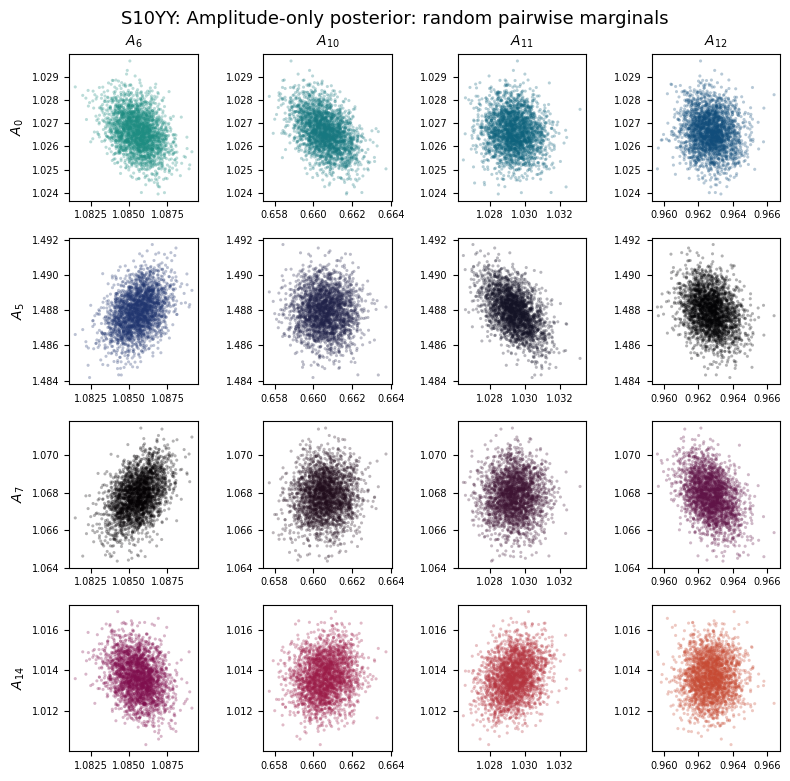

In [10]:
amplitude_parameter_labels = [rf"$A_{{{dipole}}}$" for dipole in range(N_DIPOLES)]

plot_cross_pairwise_marginals(
    amplitude_samples,
    amplitude_parameter_labels,
    group_size=4,
    seed=69,
    title=f"{tilepol}: Amplitude-only posterior: random pairwise marginals",
    outpath=f"{OUTDIR_PATH}/{tilepol}_2_Amp_Only_Random_Pairwise_Marginals.pdf"
)

Inspect the pairwise marginal projections above and set the number of clearly identifiable posterior modes below. If no compelling separation is visible, use one mode and no GMM will be fitted.

In [11]:
N_AMPLITUDE_MODES = 1

amplitude_mode_labels = fit_gmm_labels(amplitude_samples, N_AMPLITUDE_MODES)

print("Amplitude posterior mode occupancies")
print("------------------------------------")
for mode_index in range(N_AMPLITUDE_MODES):
    mask = amplitude_mode_labels == mode_index
    print(f"Mode {mode_index}: {mask.sum():5d} particles ({mask.mean():6.2%})")

Amplitude posterior mode occupancies
------------------------------------
Mode 0:  2496 particles (100.00%)


## 8. Mode-specific amplitude marginals

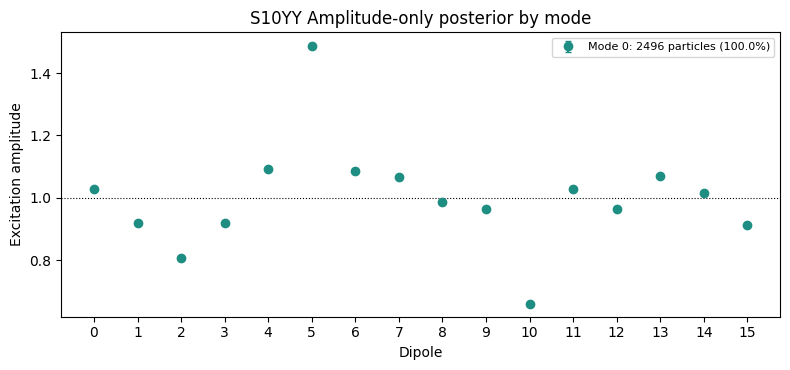

In [12]:
fig, ax = plt.subplots(figsize=(8, 3.8))

for mode_index in range(N_AMPLITUDE_MODES):
    mask = amplitude_mode_labels == mode_index
    samples = amplitude_samples[mask]
    median = np.median(samples, axis=0)
    q16 = np.percentile(samples, 16, axis=0)
    q84 = np.percentile(samples, 84, axis=0)
    x = dipoles + 0.10 * (mode_index - 0.5 * (N_AMPLITUDE_MODES - 1))

    ax.errorbar(
        x,
        median,
        yerr=np.vstack([median - q16, q84 - median]),
        fmt="o",
        capsize=2,
        color=MODE_COLORS[mode_index],
        label=f"Mode {mode_index}: {mask.sum()} particles ({mask.mean():.1%})",
    )

ax.axhline(1.0, color="black", ls=":", lw=0.8)
ax.set_xticks(dipoles)
ax.set_xlabel("Dipole")
ax.set_ylabel("Excitation amplitude")
ax.set_title(f"{tilepol} Amplitude-only posterior by mode")
ax.legend(fontsize=8)
fig.tight_layout()
plt.savefig(f"{OUTDIR_PATH}/{tilepol}_3_Amp_Only_Posterior.pdf")
plt.show()

## 9. Mode-specific correlation and corner plots

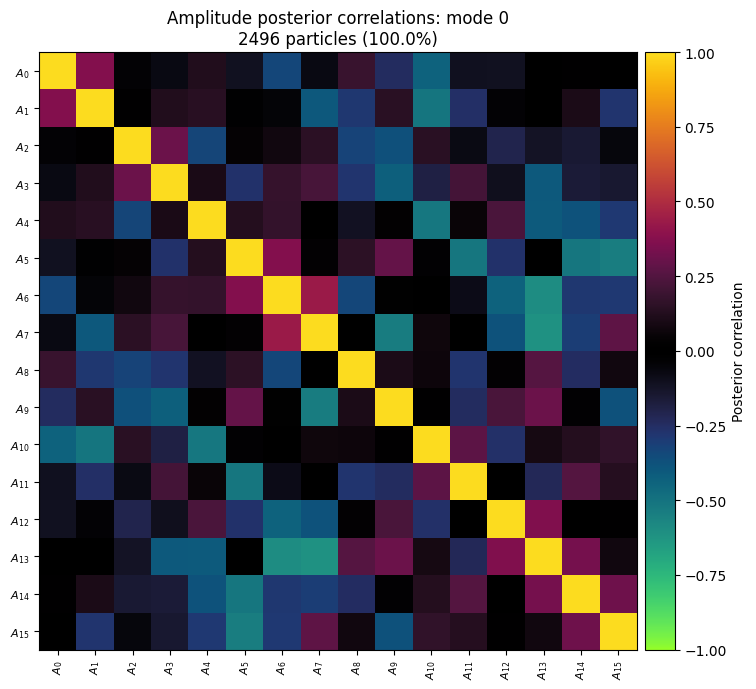

In [13]:
for mode_index in range(N_AMPLITUDE_MODES):
    mask = amplitude_mode_labels == mode_index
    plot_correlation_matrix(
        amplitude_samples[mask],
        amplitude_parameter_labels,
        f"Amplitude posterior correlations: mode {mode_index}\n{mask.sum()} particles ({mask.mean():.1%})",
    )

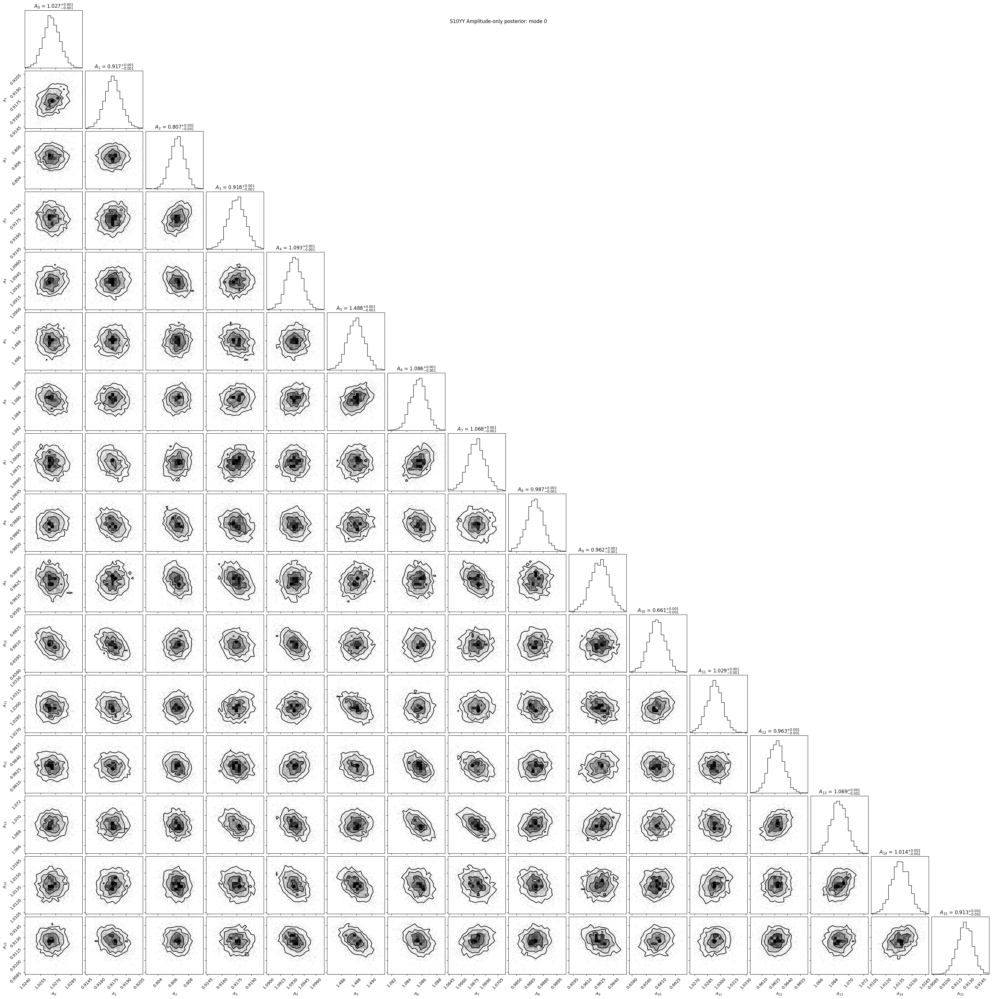

In [14]:
for mode_index in range(N_AMPLITUDE_MODES):
    mask = amplitude_mode_labels == mode_index
    if mask.sum() < 50:
        print(f"Skipping amplitude mode {mode_index}: only {mask.sum()} particles.")
        continue

    fig = corner.corner(
        amplitude_samples[mask],
        labels=amplitude_parameter_labels,
        show_titles=True,
        title_fmt=".3f",
        plot_datapoints=True,
        plot_density=True,
        fill_contours=False,
    )
    fig.suptitle(f"{tilepol} Amplitude-only posterior: mode {mode_index}", y=0.98)
    plt.savefig(f"{OUTDIR_PATH}/{tilepol}_4_{mode_index}_Amp_Only_Corner.pdf")
    plt.show()

## 10. Mode-conditional posterior-predictive beams

Posterior beams are evaluated separately for each identified amplitude mode. Mean beam, posterior standard deviation, residuals, and $\chi^2$ are calculated directly from the original SMC particles.

In [15]:
amplitude_mode_beams = []
amplitude_mode_mean_db = []
amplitude_mode_std_db = []
amplitude_mode_residual_db = []
amplitude_mode_chi2 = []
amplitude_mode_residual_rms_db = []

for mode_index in range(N_AMPLITUDE_MODES):
    mask = amplitude_mode_labels == mode_index
    beams = evaluate_posterior_beams(amplitude_complex_excitations[mask])
    mean_db = np.mean(beams, axis=0)
    std_db = np.std(beams, axis=0, ddof=1)
    residual_db = mean_db - observed_db
    chi2 = float(np.sum((residual_db / observed_sigma_db) ** 2))
    residual_rms_db = float(np.sqrt(np.mean(residual_db**2)))

    amplitude_mode_beams.append(beams)
    amplitude_mode_mean_db.append(mean_db)
    amplitude_mode_std_db.append(std_db)
    amplitude_mode_residual_db.append(residual_db)
    amplitude_mode_chi2.append(chi2)
    amplitude_mode_residual_rms_db.append(residual_rms_db)

    print(
        f"Mode {mode_index}: n={mask.sum():5d}, fraction={mask.mean():6.2%}, "
        f"median std={np.median(std_db):.4f} dB, RMS residual={residual_rms_db:.4f} dB"
    )

Mode 0: n= 2496, fraction=100.00%, median std=0.0143 dB, RMS residual=2.6066 dB


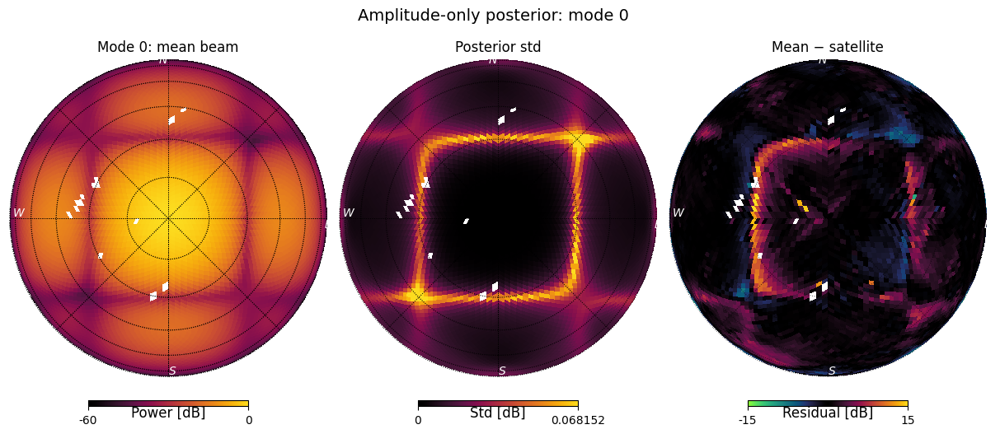

In [16]:
amplitude_std_limit = np.percentile(np.concatenate(amplitude_mode_std_db), 99.5)
amplitude_residual_limit = np.percentile(np.abs(np.concatenate(amplitude_mode_residual_db)), 99)

for mode_index in range(N_AMPLITUDE_MODES):
    fig = plt.figure(figsize=(12, 5.4))
    plot_healpix_map(
        comparison_values_to_healpix(amplitude_mode_mean_db[mode_index]),
        fig=fig,
        sub=(1, 3, 1),
        title=f"Mode {mode_index}: mean beam",
        unit="Power [dB]",
        vmin=-60,
        vmax=0,
        cmap=wfr_lin,
    )
    plot_healpix_map(
        comparison_values_to_healpix(amplitude_mode_std_db[mode_index]),
        fig=fig,
        sub=(1, 3, 2),
        title="Posterior std",
        unit="Std [dB]",
        vmin=0,
        vmax=amplitude_std_limit,
        cmap=wfr_lin,
    )
    plot_healpix_map(
        comparison_values_to_healpix(amplitude_mode_residual_db[mode_index]),
        fig=fig,
        sub=(1, 3, 3),
        title="Mean − satellite",
        unit="Residual [dB]",
        # vmin=-amplitude_residual_limit,
        # vmax=amplitude_residual_limit,
        vmin=-15,
        vmax=15,
        cmap=wfr_div,
    )
    fig.suptitle(f"Amplitude-only posterior: mode {mode_index}", fontsize=14, y=0.98)
    plt.savefig(f"{OUTDIR_PATH}/{tilepol}_5_{mode_index}_Amp_Only_Posterior_Maps.pdf")
    plt.show()

## 11. Predictive comparison between amplitude modes

In [17]:
if N_AMPLITUDE_MODES == 1:
    print("The amplitude posterior was treated as a single mode.")
else:
    for mode_i in range(N_AMPLITUDE_MODES):
        for mode_j in range(mode_i + 1, N_AMPLITUDE_MODES):
            difference_db = amplitude_mode_mean_db[mode_j] - amplitude_mode_mean_db[mode_i]
            combined_std_db = np.sqrt(
                amplitude_mode_std_db[mode_i] ** 2 + amplitude_mode_std_db[mode_j] ** 2
            )
            separation = np.divide(
                np.abs(difference_db),
                combined_std_db,
                out=np.full_like(difference_db, np.nan),
                where=combined_std_db > 0,
            )

            print(f"Mode {mode_i} vs mode {mode_j}")
            print("----------------")
            print(f"Beam RMS difference:        {np.sqrt(np.mean(difference_db**2)):.6f} dB")
            print(f"Maximum beam difference:    {np.max(np.abs(difference_db)):.6f} dB")
            print(f"Median separation:          {np.nanmedian(separation):.3f} sigma")
            print(f"95th percentile separation: {np.nanpercentile(separation, 95):.3f} sigma")
            print(f"Maximum separation:         {np.nanmax(separation):.3f} sigma")
            print()

The amplitude posterior was treated as a single mode.


# Part II — Amplitude + phase model

The full complex posterior is treated in the same hierarchy. The global phase representation is prepared once for visual mode identification and GMM labeling. After modes are assigned, each mode gets its own local circular phase centering for correlation and corner analysis.

## 12. Prepare phase coordinates and inspect posterior modes

In [18]:
relative_phases_rad = complex_phases_rad[:, 1:]

phase_circular_mean_rad = np.angle(
    np.mean(np.exp(1j * relative_phases_rad), axis=0)
)

phase_offsets_rad = np.angle(
    np.exp(1j * (relative_phases_rad - phase_circular_mean_rad[None, :]))
)
phase_offsets_deg = np.rad2deg(phase_offsets_rad)

complex_amplitude_parameter_labels = [
    rf"$A_{{{dipole}}}$" for dipole in range(N_DIPOLES)
]
complex_phase_parameter_labels = [
    rf"$\phi_{{{dipole}}}$" for dipole in range(1, N_DIPOLES)
]

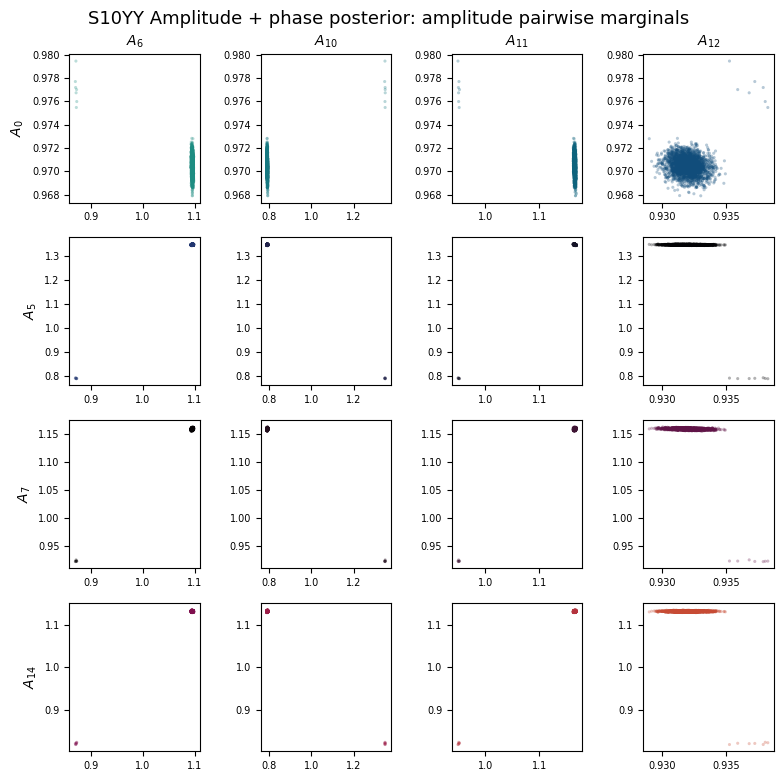

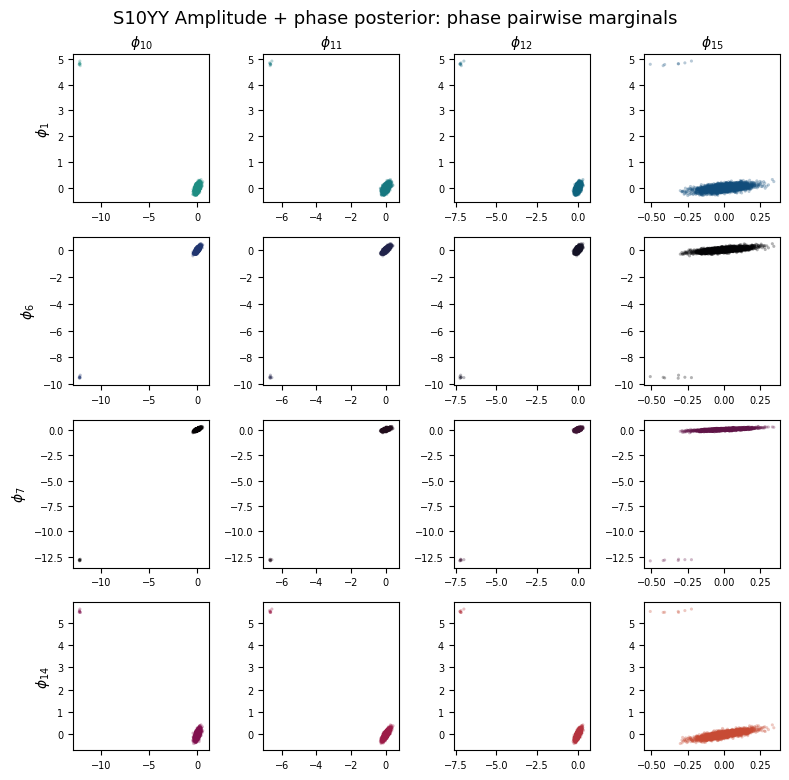

In [19]:
plot_cross_pairwise_marginals(
    complex_amplitudes,
    complex_amplitude_parameter_labels,
    group_size=4,
    seed=69,
    title=f"{tilepol} Amplitude + phase posterior: amplitude pairwise marginals",
    outpath=f"{OUTDIR_PATH}/{tilepol}_6_Amp_Phase_Random_Amp_Pairwise_Marginals.pdf"

)

plot_cross_pairwise_marginals(
    phase_offsets_deg,
    complex_phase_parameter_labels,
    group_size=4,
    seed=69,
    title=f"{tilepol} Amplitude + phase posterior: phase pairwise marginals",
    outpath=f"{OUTDIR_PATH}/{tilepol}_7_Amp_Phase_Random_Phase_Pairwise_Marginals.pdf"
)

Set the number of visually identified joint amplitude–phase modes below. When multiple modes are present, the GMM is fitted to all 16 amplitudes and 15 globally centered relative phases together.

In [20]:
N_COMPLEX_MODES = 2

complex_mode_samples = np.column_stack([complex_amplitudes, phase_offsets_deg])
complex_mode_labels = fit_gmm_labels(complex_mode_samples, N_COMPLEX_MODES)

print("Complex posterior mode occupancies")
print("----------------------------------")
for mode_index in range(N_COMPLEX_MODES):
    mask = complex_mode_labels == mode_index
    print(f"Mode {mode_index}: {mask.sum():5d} particles ({mask.mean():6.2%})")

Complex posterior mode occupancies
----------------------------------
Mode 0:  2475 particles (99.16%)
Mode 1:    21 particles ( 0.84%)


## 13. Mode-specific excitation solutions

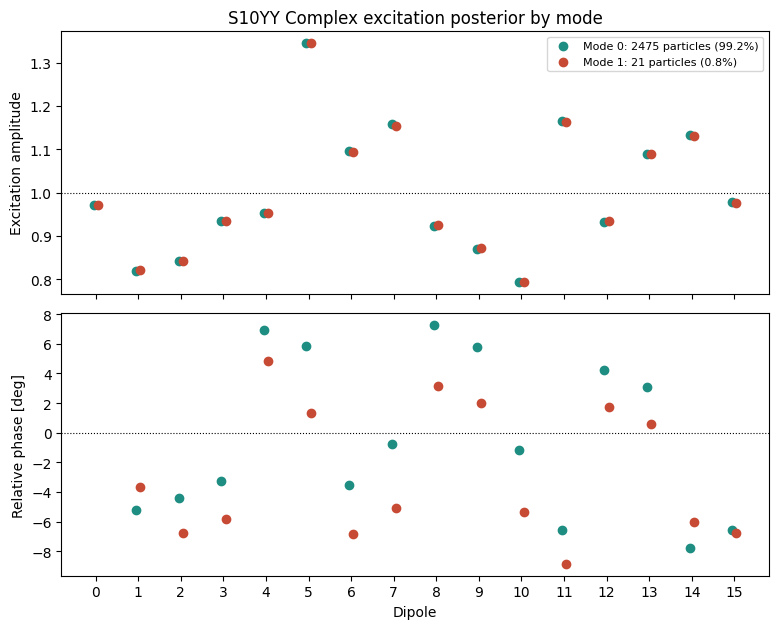

In [21]:
complex_mode_parameter_samples = []
complex_mode_phase_mean_deg = []
complex_mode_phase_low_error_deg = []
complex_mode_phase_high_error_deg = []

fig, (ax_amp, ax_phase) = plt.subplots(2, 1, figsize=(8, 6.4), sharex=True)

for mode_index in range(N_COMPLEX_MODES):
    mask = complex_mode_labels == mode_index
    mode_amplitudes = complex_amplitudes[mask]
    mode_phases_rad = relative_phases_rad[mask]

    amp_median = np.median(mode_amplitudes, axis=0)
    amp_q16 = np.percentile(mode_amplitudes, 16, axis=0)
    amp_q84 = np.percentile(mode_amplitudes, 84, axis=0)

    phase_mean_rad = np.angle(np.mean(np.exp(1j * mode_phases_rad), axis=0))
    mode_phase_offsets_deg = np.rad2deg(
        np.angle(np.exp(1j * (mode_phases_rad - phase_mean_rad[None, :])))
    )
    phase_q16_deg = np.percentile(mode_phase_offsets_deg, 16, axis=0)
    phase_q84_deg = np.percentile(mode_phase_offsets_deg, 84, axis=0)
    phase_low_error_deg = np.maximum(0.0, -phase_q16_deg)
    phase_high_error_deg = np.maximum(0.0, phase_q84_deg)

    complex_mode_parameter_samples.append(
        np.column_stack([mode_amplitudes, mode_phase_offsets_deg])
    )
    complex_mode_phase_mean_deg.append(np.rad2deg(phase_mean_rad))
    complex_mode_phase_low_error_deg.append(phase_low_error_deg)
    complex_mode_phase_high_error_deg.append(phase_high_error_deg)

    x = dipoles + 0.10 * (mode_index - 0.5 * (N_COMPLEX_MODES - 1))

    # ax_amp.errorbar(
    #     x,
    #     amp_median,
    #     yerr=np.vstack([amp_median - amp_q16, amp_q84 - amp_median]),
    #     fmt="o",
    #     capsize=2,
    #     color=MODE_COLORS[mode_index],
    #     label=f"Mode {mode_index}: {mask.sum()} particles ({mask.mean():.1%})",
    # )

    # ax_phase.errorbar(
    #     x[1:],
    #     np.rad2deg(phase_mean_rad),
    #     yerr=np.vstack([phase_low_error_deg, phase_high_error_deg]),
    #     fmt="o",
    #     capsize=2,
    #     color=MODE_COLORS[mode_index],
    # )

    ax_amp.scatter(
        x,
        amp_median,
        # fmt="o",
        color=MODE_COLORS[mode_index],
        label=f"Mode {mode_index}: {mask.sum()} particles ({mask.mean():.1%})",
    )

    ax_phase.scatter(
        x[1:],
        np.rad2deg(phase_mean_rad),
        # fmt="o",
        color=MODE_COLORS[mode_index],
    )

ax_amp.axhline(1.0, color="black", ls=":", lw=0.8)
ax_phase.axhline(0.0, color="black", ls=":", lw=0.8)
ax_amp.set_ylabel("Excitation amplitude")
ax_phase.set_ylabel("Relative phase [deg]")
ax_phase.set_xlabel("Dipole")
ax_phase.set_xticks(dipoles)
ax_amp.legend(fontsize=8)
ax_amp.set_title(f"{tilepol} Complex excitation posterior by mode")
fig.tight_layout()
plt.savefig(f"{OUTDIR_PATH}/{tilepol}_8_Complex_Posterior.pdf")
plt.show()

## 14. Mode-specific correlation and corner plots

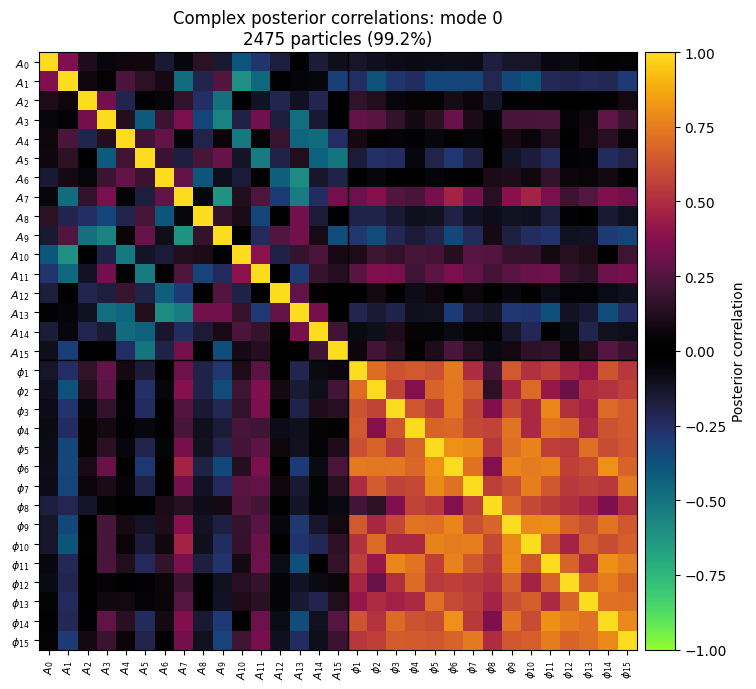

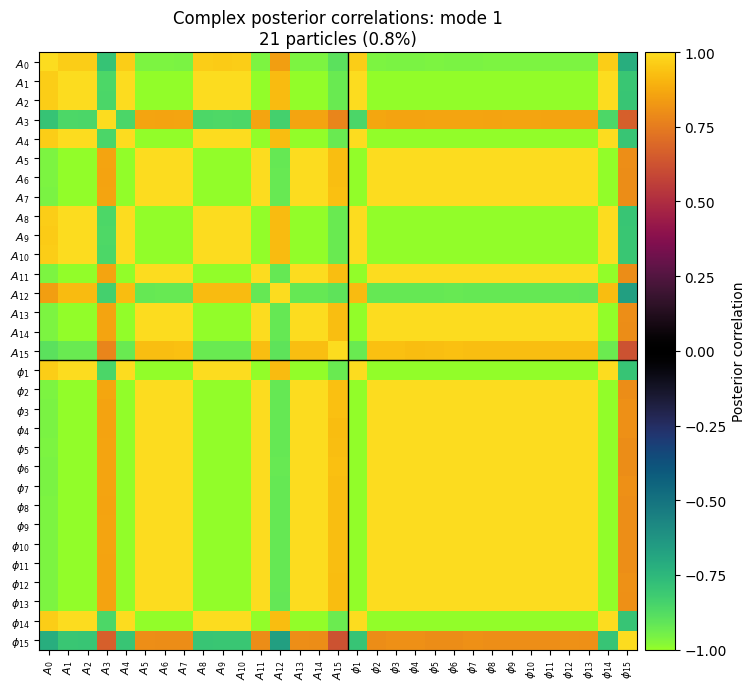

In [22]:
complex_parameter_labels = (
    [rf"$A_{{{i}}}$" for i in range(N_DIPOLES)]
    + [rf"$\phi_{{{i}}}$" for i in range(1, N_DIPOLES)]
)

for mode_index in range(N_COMPLEX_MODES):
    mask = complex_mode_labels == mode_index
    plot_correlation_matrix(
        complex_mode_parameter_samples[mode_index],
        complex_parameter_labels,
        f"Complex posterior correlations: mode {mode_index}\n{mask.sum()} particles ({mask.mean():.1%})",
        boundary=N_DIPOLES,
    )

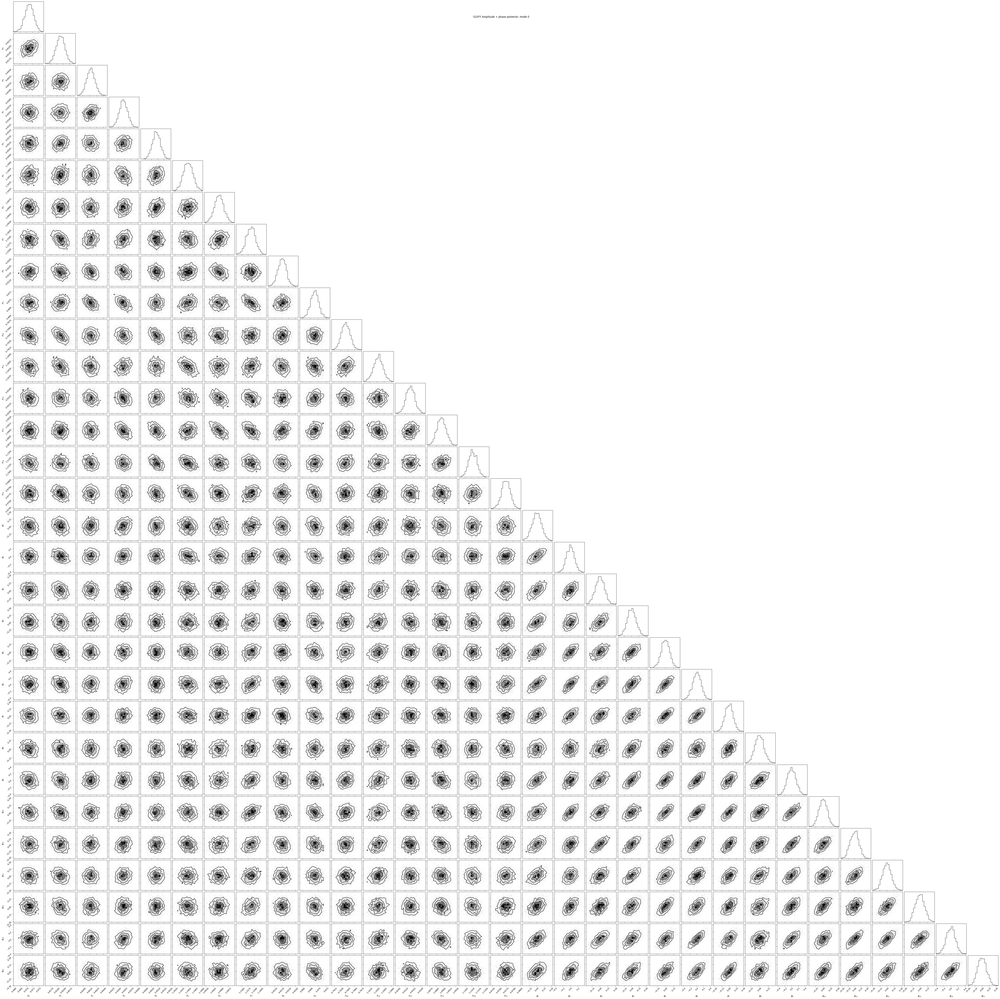

Skipping complex mode 1: only 21 particles.


In [23]:
for mode_index in range(N_COMPLEX_MODES):
    mask = complex_mode_labels == mode_index
    if mask.sum() < 50:
        print(f"Skipping complex mode {mode_index}: only {mask.sum()} particles.")
        continue

    fig = corner.corner(
        complex_mode_parameter_samples[mode_index],
        labels=complex_parameter_labels,
        show_titles=False,
        plot_datapoints=True,
        plot_density=True,
        fill_contours=False,
    )
    fig.suptitle(f"{tilepol} Amplitude + phase posterior: mode {mode_index}", y=0.98)
    plt.savefig(f"{OUTDIR_PATH}/{tilepol}_9_{mode_index}_Complex_Corner.pdf")
    plt.show()

## 15. Mode-conditional posterior-predictive beams

In [24]:
complex_mode_beams = []
complex_mode_mean_db = []
complex_mode_std_db = []
complex_mode_residual_db = []
complex_mode_chi2 = []
complex_mode_residual_rms_db = []

for mode_index in range(N_COMPLEX_MODES):
    mask = complex_mode_labels == mode_index
    beams = evaluate_posterior_beams(complex_complex_excitations[mask])
    mean_db = np.mean(beams, axis=0)
    std_db = np.std(beams, axis=0, ddof=1)
    residual_db = mean_db - observed_db
    chi2 = float(np.sum((residual_db / observed_sigma_db) ** 2))
    residual_rms_db = float(np.sqrt(np.mean(residual_db**2)))

    complex_mode_beams.append(beams)
    complex_mode_mean_db.append(mean_db)
    complex_mode_std_db.append(std_db)
    complex_mode_residual_db.append(residual_db)
    complex_mode_chi2.append(chi2)
    complex_mode_residual_rms_db.append(residual_rms_db)

    print(
        f"Mode {mode_index}: n={mask.sum():5d}, fraction={mask.mean():6.2%}, "
        f"median std={np.median(std_db):.4f} dB, RMS residual={residual_rms_db:.4f} dB"
    )

Mode 0: n= 2475, fraction=99.16%, median std=0.0200 dB, RMS residual=2.1997 dB
Mode 1: n=   21, fraction= 0.84%, median std=0.0228 dB, RMS residual=2.1999 dB


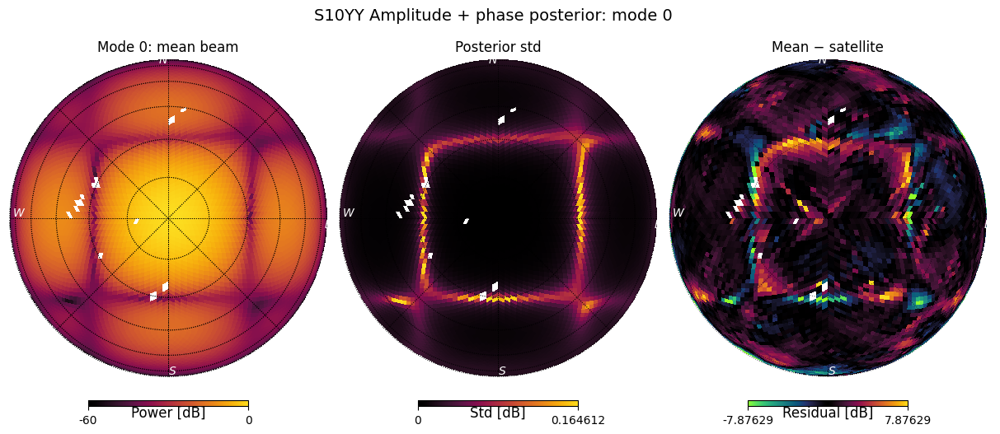

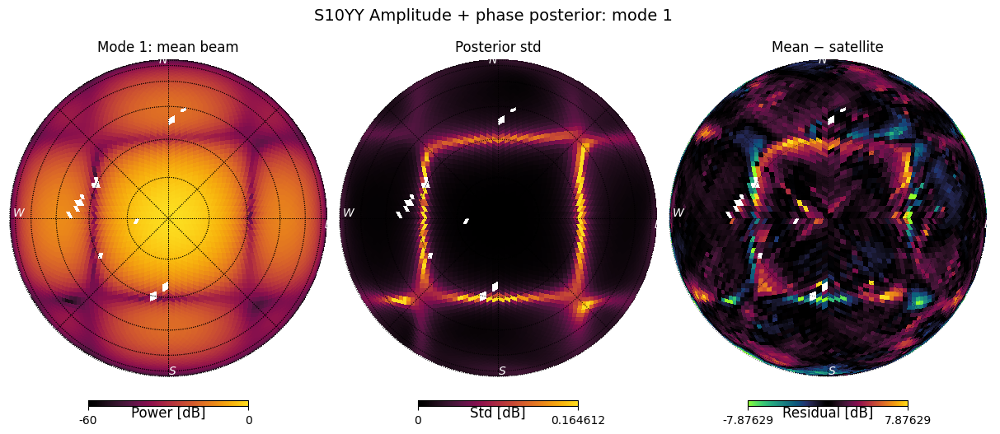

In [25]:
complex_std_limit = np.percentile(np.concatenate(complex_mode_std_db), 99.5)
complex_residual_limit = np.percentile(
    np.abs(np.concatenate(complex_mode_residual_db)), 99
)

for mode_index in range(N_COMPLEX_MODES):
    fig = plt.figure(figsize=(12, 5.4))
    plot_healpix_map(
        comparison_values_to_healpix(complex_mode_mean_db[mode_index]),
        fig=fig,
        sub=(1, 3, 1),
        title=f"Mode {mode_index}: mean beam",
        unit="Power [dB]",
        vmin=-60,
        vmax=0,
        cmap=wfr_lin,
    )
    plot_healpix_map(
        comparison_values_to_healpix(complex_mode_std_db[mode_index]),
        fig=fig,
        sub=(1, 3, 2),
        title="Posterior std",
        unit="Std [dB]",
        vmin=0,
        vmax=complex_std_limit,
        cmap=wfr_lin,
    )
    plot_healpix_map(
        comparison_values_to_healpix(complex_mode_residual_db[mode_index]),
        fig=fig,
        sub=(1, 3, 3),
        title="Mean − satellite",
        unit="Residual [dB]",
        vmin=-complex_residual_limit,
        vmax=complex_residual_limit,
        cmap=wfr_div,
    )
    fig.suptitle(f"{tilepol} Amplitude + phase posterior: mode {mode_index}", fontsize=14, y=0.98)
    plt.savefig(f"{OUTDIR_PATH}/{tilepol}_10_{mode_index}_Amp_Phase_Posterior_Maps.pdf")
    plt.show()

Complex posterior mode comparison
---------------------------------
RMS beam difference:       0.0128 dB
Median |beam difference|:  0.0028 dB

Median uncertainty:        0.0306 dB
Median |Δ| / σΔ:           0.102
95th percentile |Δ| / σΔ: 0.333
Pixels within 1σ:          100.0%
Pixels within 2σ:          100.0%


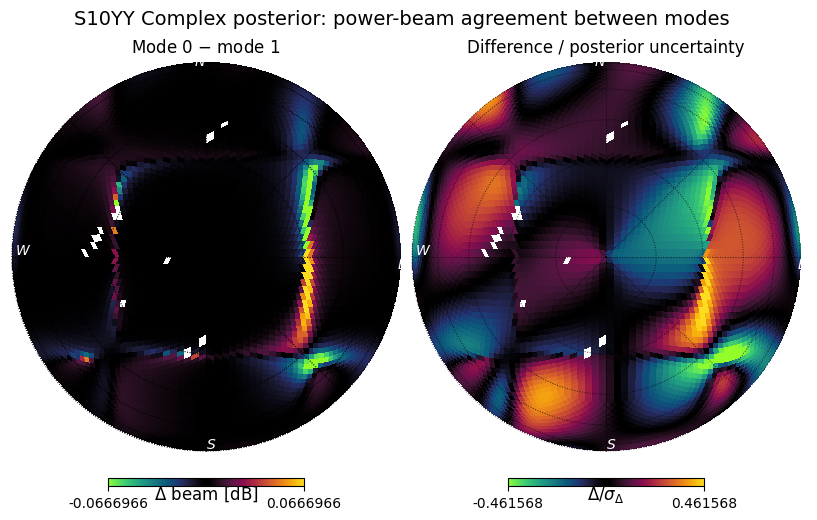

In [26]:
# ---------------------------------------------------------------------
# Statistical comparison of the two complex posterior modes
# ---------------------------------------------------------------------

if N_COMPLEX_MODES != 2:
    raise ValueError("This comparison assumes exactly two complex modes.")

mode_difference_db = (
    complex_mode_mean_db[0]
    - complex_mode_mean_db[1]
)

mode_difference_sigma_db = np.sqrt(
    complex_mode_std_db[0]**2
    + complex_mode_std_db[1]**2
)

mode_difference_z = (
    mode_difference_db
    / mode_difference_sigma_db
)

finite = (
    np.isfinite(mode_difference_db)
    & np.isfinite(mode_difference_sigma_db)
    & (mode_difference_sigma_db > 0)
)

delta = mode_difference_db[finite]
sigma_delta = mode_difference_sigma_db[finite]
z = mode_difference_z[finite]

print("Complex posterior mode comparison")
print("---------------------------------")
print(f"RMS beam difference:       {np.sqrt(np.mean(delta**2)):.4f} dB")
print(f"Median |beam difference|:  {np.median(np.abs(delta)):.4f} dB")
print()
print(f"Median uncertainty:        {np.median(sigma_delta):.4f} dB")
print(f"Median |Δ| / σΔ:           {np.median(np.abs(z)):.3f}")
print(f"95th percentile |Δ| / σΔ: {np.percentile(np.abs(z), 95):.3f}")
print(f"Pixels within 1σ:          {np.mean(np.abs(z) < 1):.1%}")
print(f"Pixels within 2σ:          {np.mean(np.abs(z) < 2):.1%}")


# ---------------------------------------------------------------------
# Maps
# ---------------------------------------------------------------------

difference_limit = np.percentile(np.abs(delta), 99.5)
# z_limit = max(1, np.percentile(np.abs(z), 99.5))
z_limit = np.percentile(np.abs(z), 99.5)

fig = plt.figure(figsize=(8, 5.2))

plot_healpix_map(
    comparison_values_to_healpix(mode_difference_db),
    fig=fig,
    sub=(1, 2, 1),
    title=r"Mode 0 $-$ mode 1",
    unit=r"$\Delta$ beam [dB]",
    vmin=-difference_limit,
    vmax=difference_limit,
    # vmin=-0.05,
    # vmax=0.05,
    cmap=wfr_div,
)

plot_healpix_map(
    comparison_values_to_healpix(mode_difference_z),
    fig=fig,
    sub=(1, 2, 2),
    title=r"Difference / posterior uncertainty",
    unit=r"$\Delta / \sigma_\Delta$",
    vmin=-z_limit,
    vmax=z_limit,
    # vmin=-0.5,
    # vmax=0.5,
    cmap=wfr_div,
)

fig.suptitle(
    f"{tilepol} Complex posterior: power-beam agreement between modes",
    fontsize=14,
    y=1.0,
)

plt.savefig(f"{OUTDIR_PATH}/{tilepol}_11_Complex_Posterior_Mode_Agreement.pdf")

plt.show()

## 16. Predictive comparison between complex modes

In [27]:
if N_COMPLEX_MODES == 1:
    print("The complex posterior was treated as a single mode.")
else:
    for mode_i in range(N_COMPLEX_MODES):
        for mode_j in range(mode_i + 1, N_COMPLEX_MODES):
            difference_db = complex_mode_mean_db[mode_j] - complex_mode_mean_db[mode_i]
            combined_std_db = np.sqrt(
                complex_mode_std_db[mode_i] ** 2 + complex_mode_std_db[mode_j] ** 2
            )
            separation = np.divide(
                np.abs(difference_db),
                combined_std_db,
                out=np.full_like(difference_db, np.nan),
                where=combined_std_db > 0,
            )

            print(f"Mode {mode_i} vs mode {mode_j}")
            print("----------------")
            print(f"Beam RMS difference:        {np.sqrt(np.mean(difference_db**2)):.6f} dB")
            print(f"Maximum beam difference:    {np.max(np.abs(difference_db)):.6f} dB")
            print(f"Median separation:          {np.nanmedian(separation):.3f} sigma")
            print(f"95th percentile separation: {np.nanpercentile(separation, 95):.3f} sigma")
            print(f"Maximum separation:         {np.nanmax(separation):.3f} sigma")
            print(
                "Residual RMS difference:    "
                f"{abs(complex_mode_residual_rms_db[mode_j] - complex_mode_residual_rms_db[mode_i]):.6f} dB"
            )
            print()

Mode 0 vs mode 1
----------------
Beam RMS difference:        0.012822 dB
Maximum beam difference:    0.343854 dB
Median separation:          0.102 sigma
95th percentile separation: 0.333 sigma
Maximum separation:         0.573 sigma
Residual RMS difference:    0.000277 dB



# Part III — Nominal vs amplitude vs amplitude + phase

The dominant mode (mode 0) is used as the representative fitted beam in the final comparison. If a fitted posterior is multimodal, the preceding predictive comparison should first establish whether its modes are effectively degenerate in power-beam space.

The reduced chi-squared values use the representative posterior-mean beams. The saved BIC values use the best sampled likelihood in the final SMC population.

## 17. Fit metrics

In [28]:
N_DATA = comparison_indices.size

amplitude_model_db = amplitude_mode_mean_db[0]
complex_model_db = complex_mode_mean_db[0]

nominal_residual_db = nominal_model_db - observed_db
amplitude_residual_db = amplitude_model_db - observed_db
complex_residual_db = complex_model_db - observed_db

nominal_chi2 = float(np.sum((nominal_residual_db / observed_sigma_db) ** 2))
amplitude_chi2 = float(np.sum((amplitude_residual_db / observed_sigma_db) ** 2))
complex_chi2 = float(np.sum((complex_residual_db / observed_sigma_db) ** 2))

k_nominal = 0
k_amplitude = int(amplitude_result["latent_dim"])
k_complex = int(complex_result["latent_dim"])

nominal_reduced_chi2 = nominal_chi2 / (N_DATA - k_nominal)
amplitude_reduced_chi2 = amplitude_chi2 / (N_DATA - k_amplitude)
complex_reduced_chi2 = complex_chi2 / (N_DATA - k_complex)

nominal_rms_db = float(np.sqrt(np.mean(nominal_residual_db**2)))
amplitude_rms_db = float(np.sqrt(np.mean(amplitude_residual_db**2)))
complex_rms_db = float(np.sqrt(np.mean(complex_residual_db**2)))

nominal_log_likelihood = float(nominal_result["log_likelihood"])
amplitude_log_likelihood_best = float(amplitude_result["best_log_likelihood"])
complex_log_likelihood_best = float(complex_result["best_log_likelihood"])

nominal_bic = float(nominal_result["bic"])
amplitude_bic = float(amplitude_result["bic"])
complex_bic = float(complex_result["bic"])

print("Final model comparison")
print("----------------------")
print(
    f"{'Model':14s} {'k':>4s} {'RMS [dB]':>11s} {'chi2_red':>11s} "
    f"{'logL':>14s} {'BIC':>14s} {'Delta BIC':>14s}"
)

for name, k, rms, reduced_chi2, log_likelihood, bic in (
    ("Nominal", k_nominal, nominal_rms_db, nominal_reduced_chi2, nominal_log_likelihood, nominal_bic),
    ("Amplitude", k_amplitude, amplitude_rms_db, amplitude_reduced_chi2, amplitude_log_likelihood_best, amplitude_bic),
    ("Amp + phase", k_complex, complex_rms_db, complex_reduced_chi2, complex_log_likelihood_best, complex_bic),
):
    print(
        f"{name:14s} {k:4d} {rms:11.4f} {reduced_chi2:11.3f} "
        f"{log_likelihood:14.1f} {bic:14.1f} {bic - nominal_bic:14.1f}"
    )

print()
print("Pairwise Delta BIC")
print("------------------")
print(f"Amplitude - nominal:   {amplitude_bic - nominal_bic:.1f}")
print(f"Complex - nominal:     {complex_bic - nominal_bic:.1f}")
print(f"Complex - amplitude:   {complex_bic - amplitude_bic:.1f}")

Final model comparison
----------------------
Model             k    RMS [dB]    chi2_red           logL            BIC      Delta BIC
Nominal           0      7.8654     362.053     -1097791.0      2195582.0            0.0
Amplitude        15      2.6066      32.690       -99414.9       198960.5     -1996621.5
Amp + phase      30      2.1997      24.638       -74893.4       150048.2     -2045533.8

Pairwise Delta BIC
------------------
Amplitude - nominal:   -1996621.5
Complex - nominal:     -2045533.8
Complex - amplitude:   -48912.3


## 18. Beam and residual comparison

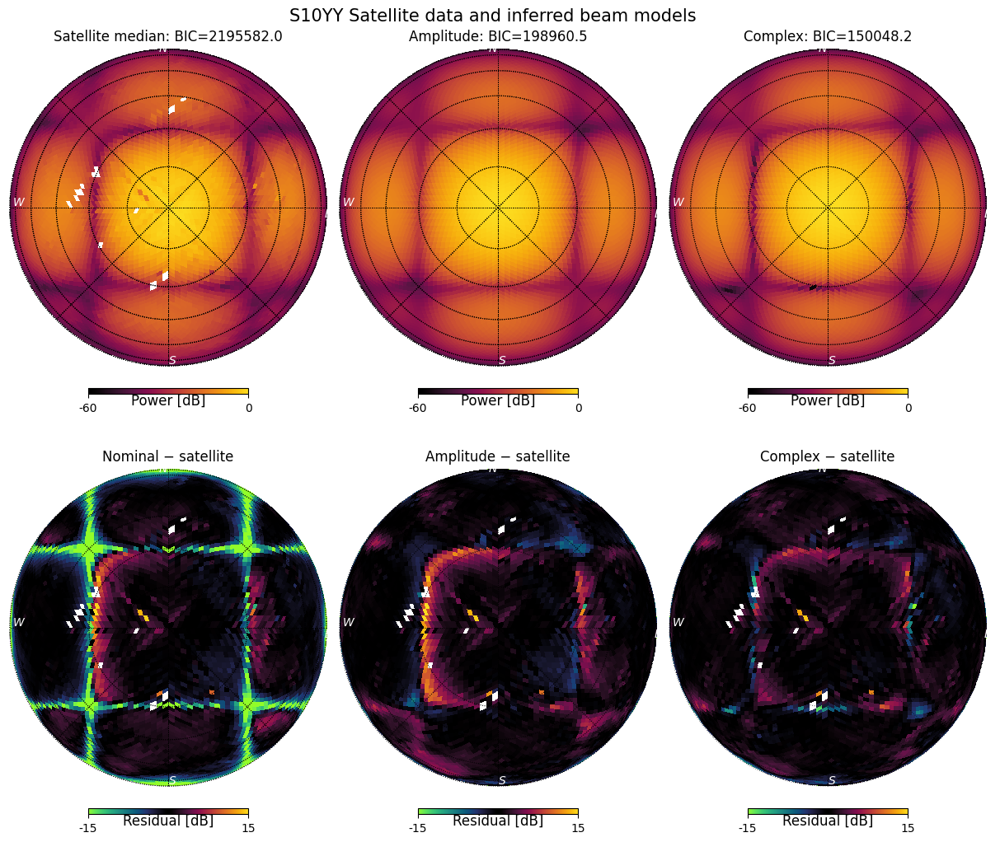

In [29]:
# ---------------------------------------------------------------------
# Full visible-sky model beams for plotting only
#
# Statistical metrics above still use the canonical comparison_indices.
# Here we evaluate the fitted beams over the entire visible hemisphere
# so that likelihood-mask holes do not appear in the figures.
# ---------------------------------------------------------------------

@jax.jit
def predict_visible_beam_db(
    excitation_pol,
):
    fixed = jnp.ones(
        N_DIPOLES,
        dtype=jnp.complex64,
    )

    excitation_pol = excitation_pol.astype(
        jnp.complex64
    )

    excitations = (
        jnp.stack(
            [
                excitation_pol,
                fixed,
            ]
        )
        if POL == 0
        else jnp.stack(
            [
                fixed,
                excitation_pol,
            ]
        )
    )

    power = aee.power(
        az_rad=az_visible,
        za_rad=za_visible,
        excitations=excitations,
        normalize=True,
    )[POL]

    power = jnp.maximum(
        power,
        jnp.finfo(
            power.dtype
        ).tiny,
    )

    return (
        10
        * jnp.log10(
            power
        )
    )


predict_visible_beam_batch_db = jax.jit(
    jax.vmap(
        predict_visible_beam_db,
        in_axes=0,
    )
)


# ---------------------------------------------------------------------
# Evaluate posterior beams for the dominant amplitude and complex modes.
# ---------------------------------------------------------------------

amplitude_mode0_mask = amplitude_mode_labels == 0
complex_mode0_mask = complex_mode_labels == 0


def evaluate_visible_beams(excitations, batch_size=256):
    batches = []

    for start in range(0, excitations.shape[0], batch_size):
        stop = min(
            start + batch_size,
            excitations.shape[0],
        )

        batch = predict_visible_beam_batch_db(
            jnp.asarray(
                excitations[
                    start:stop
                ],
                dtype=jnp.complex64,
            )
        )

        batch.block_until_ready()

        batches.append(
            np.asarray(
                batch,
                dtype=float,
            )
        )

    return np.concatenate(batches, axis=0)


amplitude_visible_beams_db = evaluate_visible_beams(
    amplitude_complex_excitations[
        amplitude_mode0_mask
    ]
)

complex_visible_beams_db = evaluate_visible_beams(
    complex_complex_excitations[
        complex_mode0_mask
    ]
)


amplitude_visible_mean_db = np.mean(
    amplitude_visible_beams_db,
    axis=0,
)

complex_visible_mean_db = np.mean(
    complex_visible_beams_db,
    axis=0,
)


# ---------------------------------------------------------------------
# Nominal model over the complete visible hemisphere.
# ---------------------------------------------------------------------

nominal_visible_db = np.asarray(
    predict_visible_beam_db(
        jnp.ones(
            N_DIPOLES,
            dtype=jnp.complex64,
        )
    ),
    dtype=float,
)


# ---------------------------------------------------------------------
# Embed the visible model vectors into full HEALPix maps.
# ---------------------------------------------------------------------

nominal_beam_map = np.full(
    N_PIXELS,
    np.nan,
    dtype=float,
)

amplitude_beam_map = np.full(
    N_PIXELS,
    np.nan,
    dtype=float,
)

complex_beam_map = np.full(
    N_PIXELS,
    np.nan,
    dtype=float,
)

nominal_beam_map[
    visible
] = nominal_visible_db

amplitude_beam_map[
    visible
] = amplitude_visible_mean_db

complex_beam_map[
    visible
] = complex_visible_mean_db


# ---------------------------------------------------------------------
# Residual maps for visualization.
#
# These use every finite satellite pixel above the horizon, not merely
# the stricter likelihood comparison mask.
# ---------------------------------------------------------------------

plot_data_mask = (
    visible
    & np.isfinite(
        data_map
    )
)

nominal_residual_map = np.full(
    N_PIXELS,
    np.nan,
    dtype=float,
)

amplitude_residual_map = np.full(
    N_PIXELS,
    np.nan,
    dtype=float,
)

complex_residual_map = np.full(
    N_PIXELS,
    np.nan,
    dtype=float,
)

nominal_residual_map[
    plot_data_mask
] = (
    nominal_beam_map[
        plot_data_mask
    ]
    - data_map[
        plot_data_mask
    ]
)

amplitude_residual_map[
    plot_data_mask
] = (
    amplitude_beam_map[
        plot_data_mask
    ]
    - data_map[
        plot_data_mask
    ]
)

complex_residual_map[
    plot_data_mask
] = (
    complex_beam_map[
        plot_data_mask
    ]
    - data_map[
        plot_data_mask
    ]
)


# ---------------------------------------------------------------------
# Plot
# ---------------------------------------------------------------------

fig = plt.figure(
    figsize=(12, 10.2)
)

# Satellite data in the upper-left panel.
plot_healpix_map(
    data_map,
    fig=fig,
    sub=(2, 3, 1),
    title=f"Satellite median: BIC={nominal_bic:.1f}",
    unit="Power [dB]",
    vmin=-60,
    vmax=0,
    cmap=wfr_lin,
)

plot_healpix_map(
    amplitude_beam_map,
    fig=fig,
    sub=(2, 3, 2),
    title=f"Amplitude: BIC={amplitude_bic:.1f}",
    unit="Power [dB]",
    vmin=-60,
    vmax=0,
    cmap=wfr_lin,
)

plot_healpix_map(
    complex_beam_map,
    fig=fig,
    sub=(2, 3, 3),
    title=f"Complex: BIC={complex_bic:.1f}",
    unit="Power [dB]",
    vmin=-60,
    vmax=0,
    cmap=wfr_lin,
)

for column, title, residual_map in (
    (
        1,
        "Nominal − satellite",
        nominal_residual_map,
    ),
    (
        2,
        "Amplitude − satellite",
        amplitude_residual_map,
    ),
    (
        3,
        "Complex − satellite",
        complex_residual_map,
    ),
):
    plot_healpix_map(
        residual_map,
        fig=fig,
        sub=(2, 3, 3 + column),
        title=title,
        unit="Residual [dB]",
        vmin=-15,
        vmax=15,
        cmap=wfr_div,
    )

fig.suptitle(f"{tilepol} Satellite data and inferred beam models", fontsize=15, y=1)
plt.savefig(f"{OUTDIR_PATH}/{tilepol}_12_Amp_Complex_Model_Comparison.pdf")

plt.show()